## Data intergration visualisation

source data: integrated object from b2 and b3 (match manuscript batch 1 and 2, b1 was allocated to poilot run)

- confirm intergration result from different assays and methods
- cluster analysis and marker check
- annotate cell populations as complet as possible
- check guide RNA distribution on integrated dataset

In [1]:
#load packages
suppressMessages({
    library(dplyr)
    library(tidyverse)

    #library(networkD3)
    library(ggplot2)
    library(ggrepel)
    #library(pheatmap)
    #library(grid)
    library(RColorBrewer)
    library(viridis)
    #library(cowplot)
    #library(hrbrthemes)
    #library(GGally)
    library(plotly)
    #library(circlize)
    #library(scCustomize)
    library(patchwork)
    
    library(Seurat)
    library(SeuratWrappers)
    library(scales)
    #library(reshape2)
    library(stringr)
    #library(magrittr)
    library(reticulate)
    library(harmony)
    library(batchelor)
})


#for regulating plot sizes
pdim<-function(x,y){
    return(options(repr.plot.width=x, repr.plot.height=y))
}


In [2]:
#for output storage
out_dir<-".../Result_export/Manuscript_visual/"

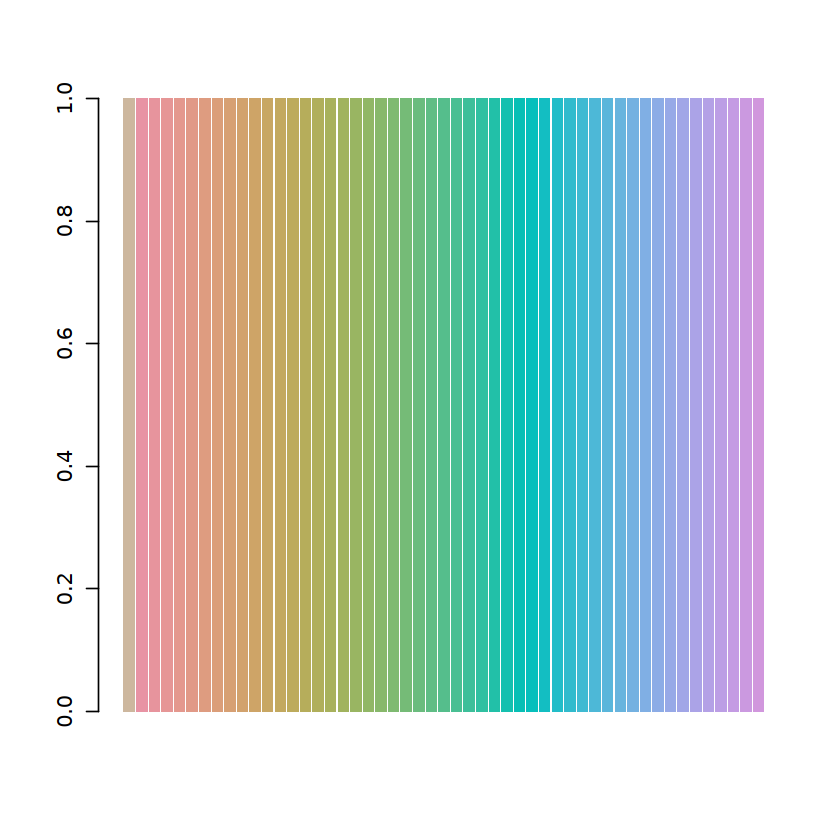

In [3]:
# install.packages("colorspace")  # if not installed
library(colorspace)

# Generate a milder qualitative palette with 50 distinct hues
color_vec <- c("bisque3",
               qualitative_hcl(
                                  n = 50,
                                  h = c(0, 300),  # full hue range
                                  c = 55,         # chroma (colorfulness) - lower than default
                                  l = 70,          # luminance (brightness) - softer look
                                   palette = "Dark 2" 
                                )
               )

# Preview
barplot(rep(1, 51), col = color_vec, border = NA)


### check data integration result from log and SCTransform normalisation
### use different methods to confirm integration results

In [250]:
kc_rna<-readRDS(".../CRISPRia_B2and3_Singlet_int.rds")
kc_sct<-readRDS(".../CRISPRia_B2and3_Singlet_SCTint.rds")

In [5]:
kc_rna
kc_sct

An object of class Seurat 
45089 features across 30452 samples within 4 assays 
Active assay: RNA (38606 features, 2000 variable features)
 5 layers present: counts.b2, counts.b3, data.b2, data.b3, scale.data
 3 other assays present: GDO, PRTB, mnn.reconstructed
 8 dimensional reductions calculated: pca, umap.unintegrated, integrated.cca, harmony, integrated.mnn, umap.cca, umap.harmony, umap.mnn

An object of class Seurat 
73233 features across 30452 samples within 4 assays 
Active assay: SCT (30144 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 3 other assays present: RNA, GDO, PRTB
 6 dimensional reductions calculated: pca, umap.unintegrated, integrated.cca, harmony, umap.cca, umap.harmony

#### join layers only for RNA assay and proceed analysis as object list
not required for SCT since it's a v3 process
ref: https://github.com/satijalab/seurat/issues/8558

In [6]:
kc_rna<-JoinLayers(kc_rna)

In [7]:
obj.list<-list(kc_rna, kc_sct)
names(obj.list)<-c("kc_rna", "kc_sct")

obj.list

$kc_rna
An object of class Seurat 
45089 features across 30452 samples within 4 assays 
Active assay: RNA (38606 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 3 other assays present: GDO, PRTB, mnn.reconstructed
 8 dimensional reductions calculated: pca, umap.unintegrated, integrated.cca, harmony, integrated.mnn, umap.cca, umap.harmony, umap.mnn

$kc_sct
An object of class Seurat 
73233 features across 30452 samples within 4 assays 
Active assay: SCT (30144 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 3 other assays present: RNA, GDO, PRTB
 6 dimensional reductions calculated: pca, umap.unintegrated, integrated.cca, harmony, umap.cca, umap.harmony


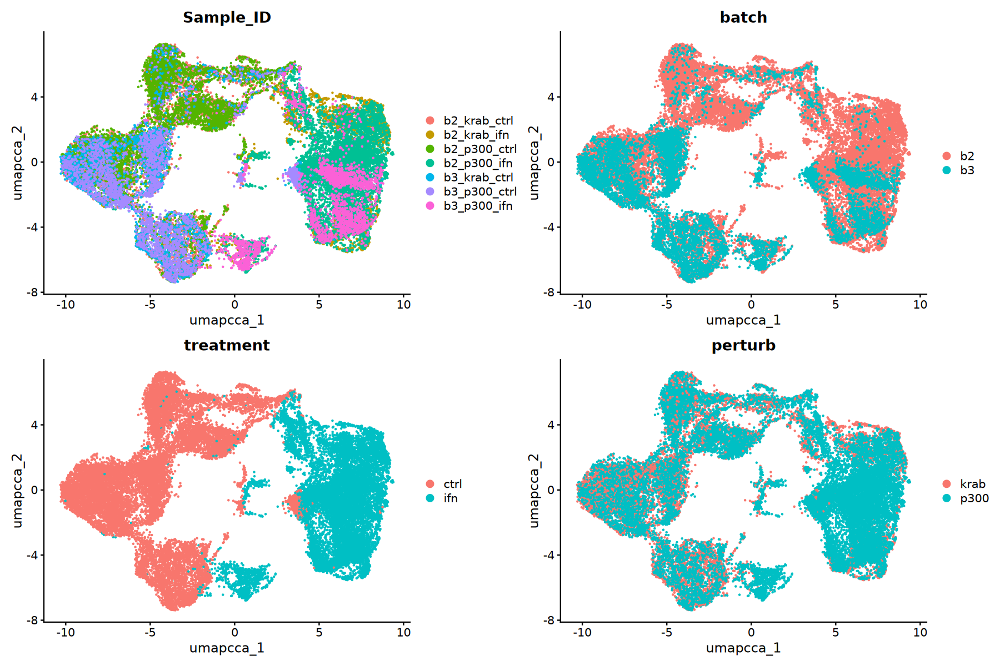

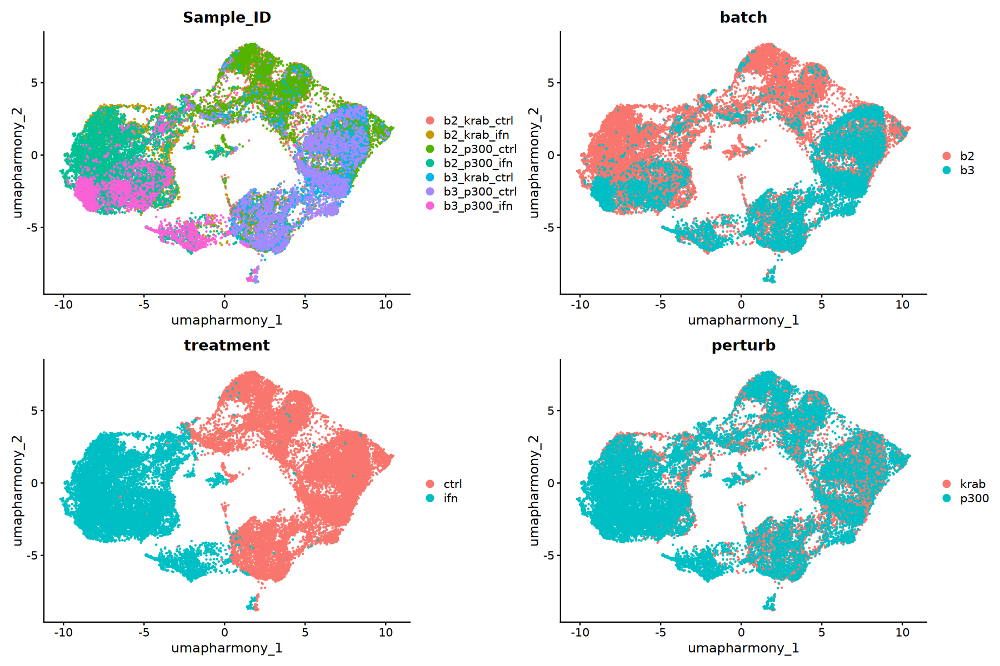

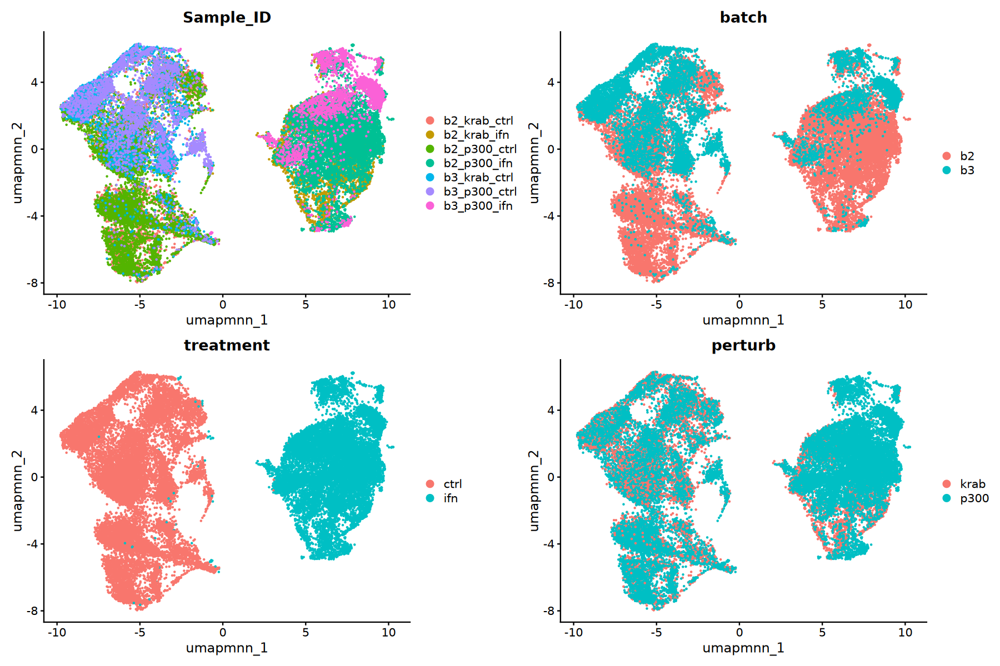

In [8]:
int.method<-c("integrated.cca", "harmony","integrated.mnn" 
              #, "integrated.scvi"
             )
int_brief_name<-c("cca", "harmony", "mnn"
                  #, "scvi"
                 )
intplot.list<-list()

pdim(15,10)
for(k in 1:3){

    print(DimPlot(kc_rna, reduction = paste0("umap.",int_brief_name[[k]]),
                          group.by = c("Sample_ID", "batch", "treatment", "perturb"),
                          label.size = 2, ncol=2)
          )
}

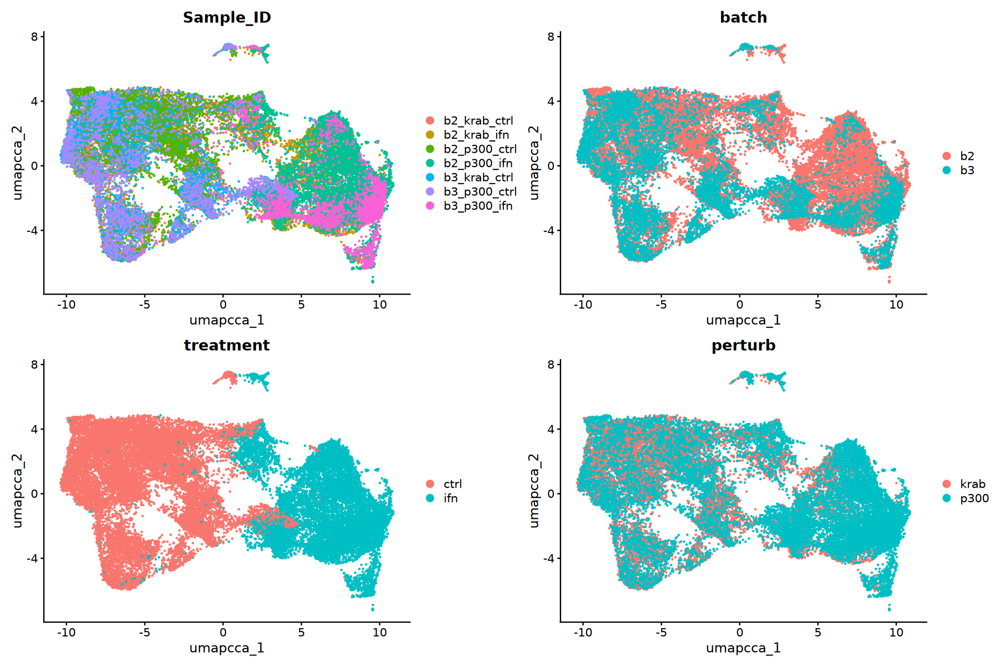

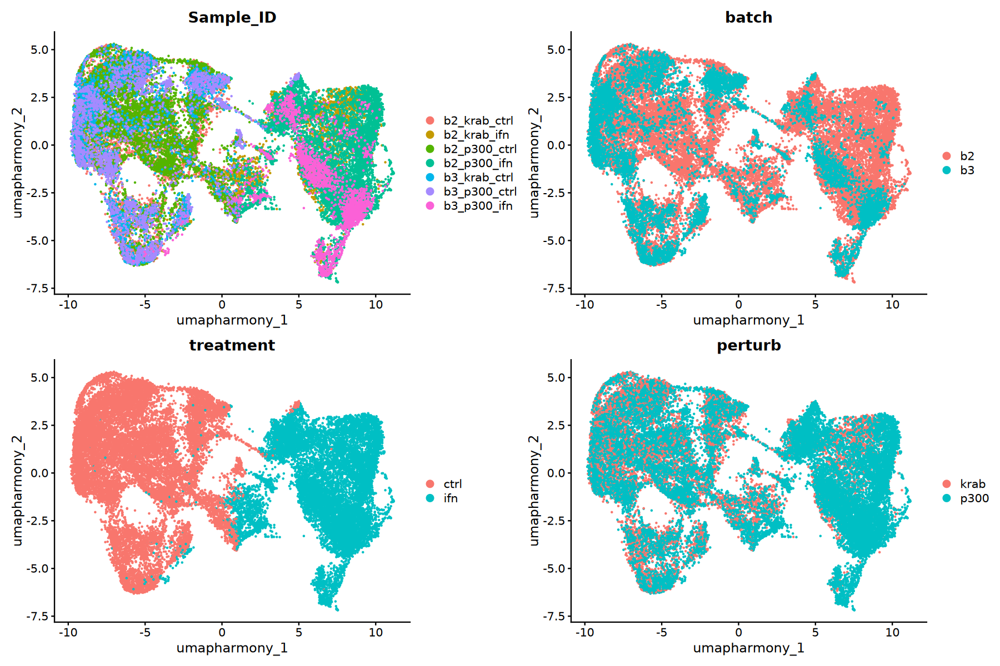

In [9]:
for(k in 1:2){

    print(DimPlot(kc_sct, reduction = paste0("umap.",int_brief_name[[k]]),
                          group.by = c("Sample_ID", "batch", "treatment", "perturb"),
                          label.size = 2, ncol=2)
          )
}

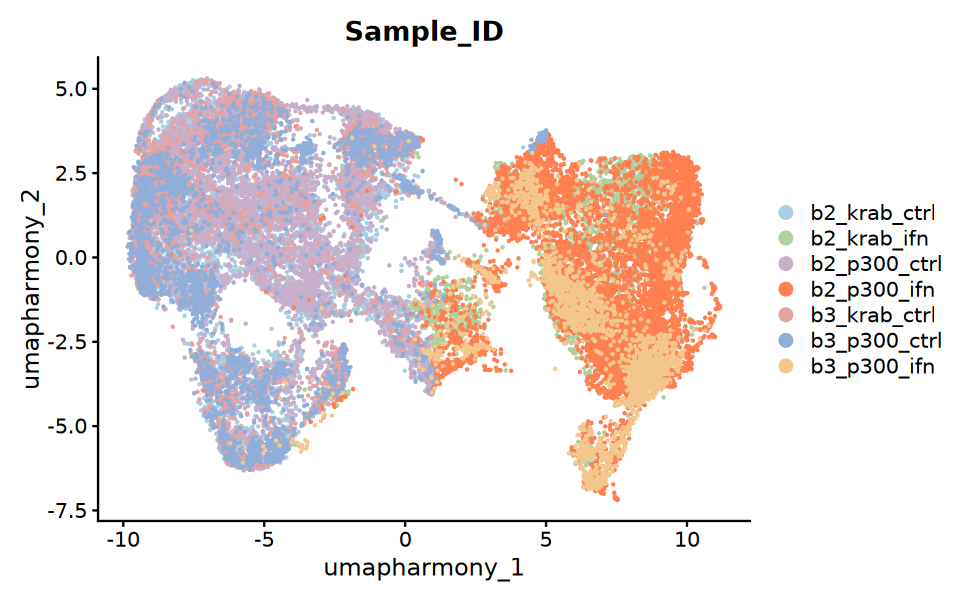

In [221]:
cbPalette <-  c(
    "#A8CEE2", # muted blue
    "#AFCF9F", # muted green
    "#C7AFCB", # muted purple
    "#FF7F50", # soft yellow
    "#E6A1A1", # muted pink/red
    "#8FAED9",
    "#F3C78D", # muted orange
    "#F3C78D" # muted orange≈
)

pdim(8,5)

DimPlot(kc_sct, reduction = "umap.harmony", 
        cols = cbPalette,
              group.by = "Sample_ID", 
              label.size = 2)

Warning message:
“The `slot` argument of `FetchData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


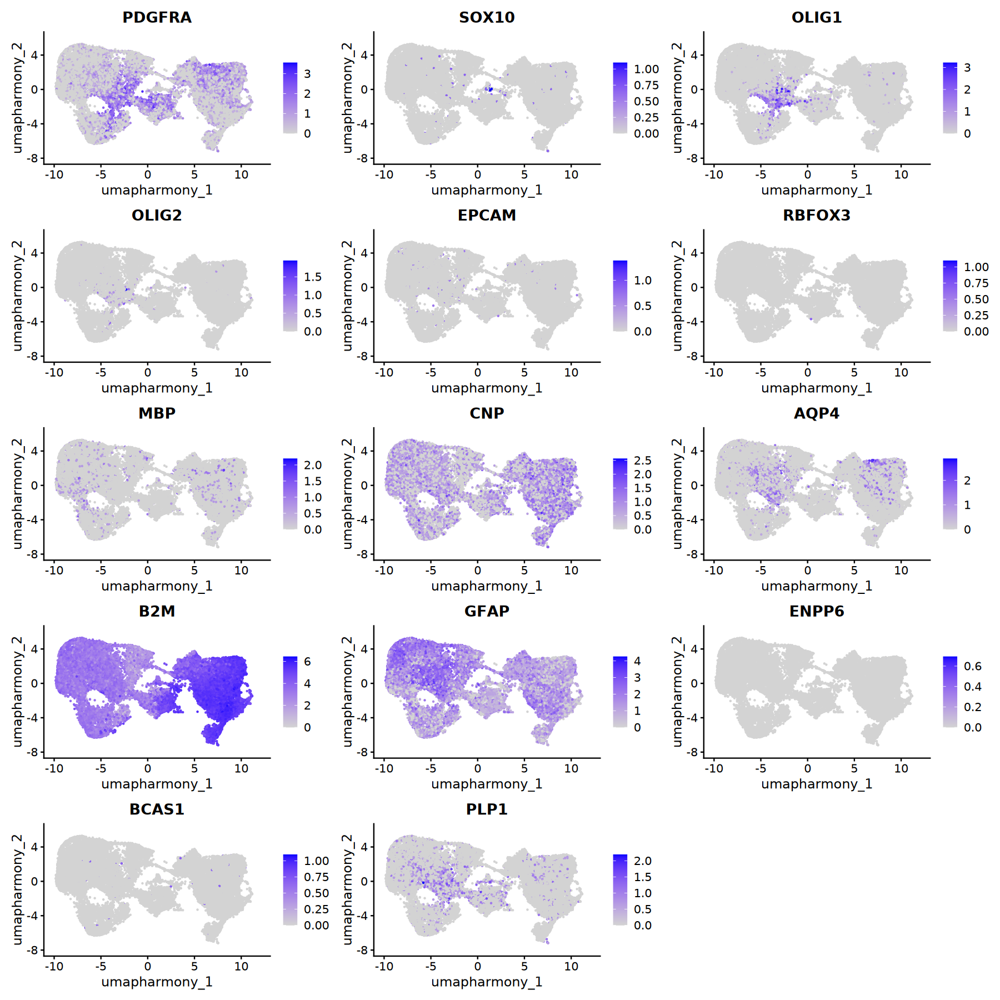

In [19]:
pdim(15,15)
FeaturePlot(kc_sct, feature = c("PDGFRA", "SOX10", "OLIG1", "OLIG2", "EPCAM",
                               "RBFOX3","MBP","CNP", "AQP4","B2M",
                               "GFAP", "ENPP6", "BCAS1", "PLP1"), 
            reduction = "umap.harmony", 
            ncol = 3)

### check gRNA distribution

In [24]:
kc_sct@meta.data$grna[kc_sct@meta.data$grna %in% c("AGPAT1-RNF5", "AGPAT1-RNF6", "AGPAT1-RNF7")] = "AGPAT1"

kc_sct@meta.data$grna<-gsub("NONT", "Non-Targeting", kc_sct@meta.data$grna)

kc_sct@meta.data$grna_lev<-factor(kc_sct@meta.data$grna, 
                              levels = c("Non-Targeting", 
                                         setdiff(unique(kc_sct@meta.data$grna), "Non-Targeting"))
                              )

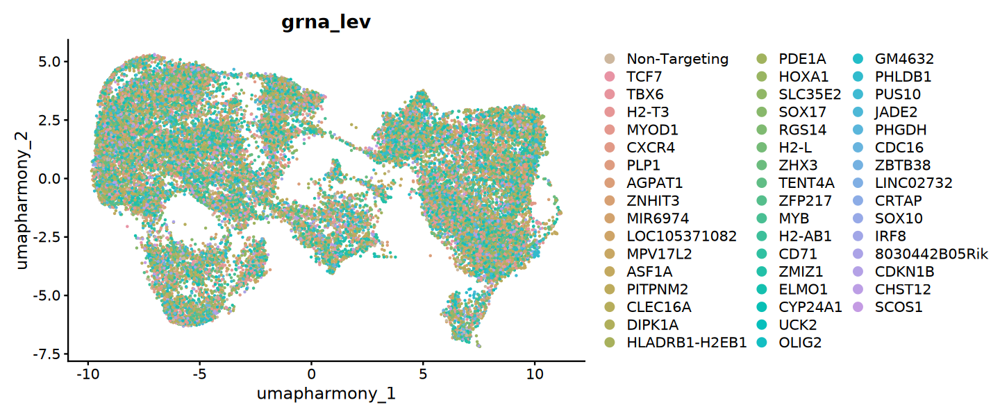

In [25]:
pdim(12,5)
DimPlot(kc_sct, group.by = "grna_lev", 
        reduction = "umap.harmony",
        label = FALSE, repel = TRUE, cols = color_vec)

### Generate seperated UMAP for each guide

In [26]:
meta_highlight<-function(obj, ident, ident_pos,col_pos, reduction){
    tmp<-obj
    Idents(tmp)<-ident
    cells_pos<-WhichCells(tmp, idents = ident_pos)

    plt<-DimPlot(tmp, label = F, group.by = ident,
                 reduction = reduction,
                cells.highlight = cells_pos) + 
        scale_color_manual(values = c("gray",col_pos),
                           #labels = c("other_cells", ident_pos)
                          ) + 
    NoLegend()+
    theme_void()+
    theme(
    legend.text = element_blank()
    )

    return(plt)
}

In [27]:
sGuide<-list()

    glist<-unique(kc_sct@meta.data$grna_lev)

    for(k in 1:length(glist)){
       grna_col<-color_vec[[k]] 
        pdim(5,4)
    sGuide[[k]]<-meta_highlight(obj = kc_sct,
              ident = "grna_lev", 
            reduction = "umap.harmony",
              ident_pos = glist[[k]],
              col_pos = grna_col) + ggtitle(glist[[k]])
    }

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is

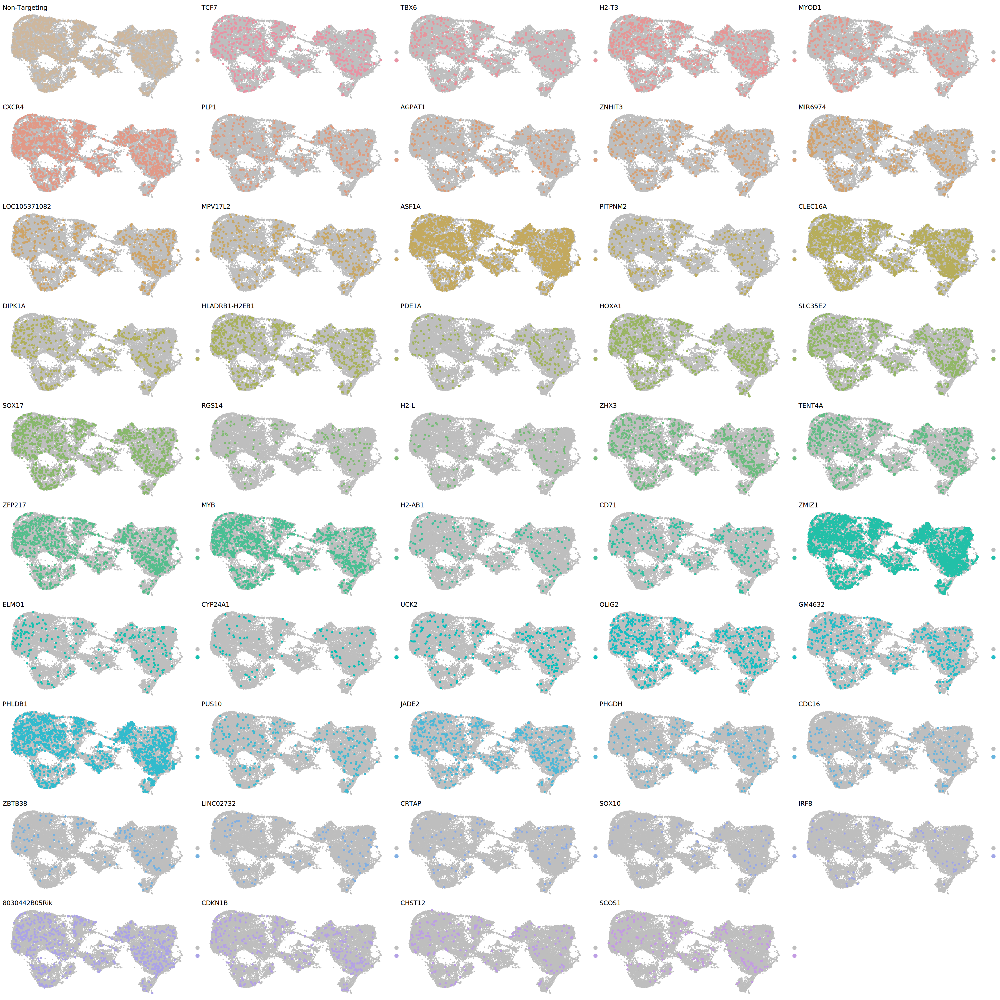

In [93]:
pdim(30,30)
(p_wrap<-wrap_plots(sGuide, ncol = 5))

### individual gRNA distribution 

#### color coded by different conditions

In [30]:
kc_sct@meta.data$Perturb_gRNA<-paste0(kc_sct@meta.data$perturb, 
                                      "_",
                                     kc_sct@meta.data$grna_lev)

unique(kc_sct@meta.data$Perturb_gRNA)

[1] "krab_Non-Targeting" "krab_TCF7"          "krab_TBX6"         
 [4] "krab_H2-T3"         "krab_MYOD1"         "krab_CXCR4"        
 [7] "krab_PLP1"          "krab_AGPAT1"        "krab_ZNHIT3"       
[10] "krab_MIR6974"       "krab_LOC105371082"  "krab_MPV17L2"      
[13] "krab_ASF1A"         "krab_PITPNM2"       "krab_CLEC16A"      
[16] "krab_DIPK1A"        "krab_HLADRB1-H2EB1" "krab_PDE1A"        
[19] "krab_HOXA1"         "krab_SLC35E2"       "krab_SOX17"        
[22] "krab_RGS14"         "krab_H2-L"          "krab_ZHX3"         
[25] "krab_TENT4A"        "krab_ZFP217"        "krab_MYB"          
[28] "krab_H2-AB1"        "krab_CD71"          "krab_ZMIZ1"        
[31] "krab_ELMO1"         "krab_CYP24A1"       "krab_UCK2"         
[34] "krab_OLIG2"         "krab_GM4632"        "krab_PHLDB1"       
[37] "krab_PUS10"         "krab_JADE2"         "krab_PHGDH"        
[40] "krab_CDC16"         "krab_ZBTB38"        "krab_LINC02732"    
[43] "krab_CRTAP"         "krab_SOX10"         "krab_IRF8"         
[46] "krab_8030442B05Rik" "krab_CDKN1B"        "krab_CHST12"       
[49] "krab_SCOS1"         "p300_ZMIZ1"         "p300_PHLDB1"       
[52] "p300_ASF1A"         "p300_ZFP217"        "p300_MYB"          
[55] "p300_SLC35E2"       "p300_CDKN1B"        "p300_HOXA1"        
[58] "p300_SOX17"         "p300_CXCR4"         "p300_IRF8"         
[61] "p300_TBX6"          "p300_CLEC16A"       "p300_PLP1"         
[64] "p300_ELMO1"         "p300_MPV17L2"       "p300_HLADRB1-H2EB1"
[67] "p300_PHGDH"         "p300_PITPNM2"       "p300_Non-Targeting"
[70] "p300_H2-T3"         "p300_8030442B05Rik" "p300_TENT4A"       
[73] "p300_CYP24A1"       "p300_PUS10"         "p300_MIR6974"      
[76] "p300_CHST12"        "p300_OLIG2"         "p300_H2-L"         
[79] "p300_TCF7"          "p300_MYOD1"         "p300_LOC105371082" 
[82] "p300_DIPK1A"        "p300_ZHX3"          "p300_CD71"         
[85] "p300_LINC02732"     "p300_JADE2"         "p300_SCOS1"        
[88] "p300_GM4632"        "p300_UCK2"          "p300_ZNHIT3"       
[91] "p300_PDE1A"         "p300_RGS14"         "p300_CDC16"        
[94] "p300_AGPAT1"        "p300_ZBTB38"        "p300_H2-AB1"       
[97] "p300_SOX10"         "p300_CRTAP"

In [63]:
perturb_gRNA_highlight<-function(gRNA){
    keep_values<-c(paste0(c("krab_","p300_"), gRNA),
                 "krab_Non-Targeting","p300_Non-Targeting")

    vec<-ifelse(kc_sct@meta.data$Perturb_gRNA %in% keep_values,
                kc_sct@meta.data$Perturb_gRNA,
                "Other")

    #remove prefix from non targeting
    kc_sct@meta.data$highlight<-ifelse(grepl("Non-Targeting", vec),
                                       sub("^[^_]+_", "", vec),
                                       vec)

    kc_sct@meta.data$highlight<-factor(kc_sct@meta.data$highlight,
                                       levels = c("Non-Targeting",
                                                  paste0(c("krab_","p300_"), gRNA),
                                                  "Other")
                                       )
    light_gray_transparent <- rgb(red = 211, green = 211, blue = 211, alpha = 128, maxColorValue = 255)
    #plot UMAP
    plt<-DimPlot(kc_sct, 
                 group.by = "highlight",
                 reduction = "umap.harmony",
                 label = FALSE, pt.size = 1.5,
                 cols = c("bisque3", "deepskyblue4", "indianred3", light_gray_transparent)
                )

    print(plt)
                            
}

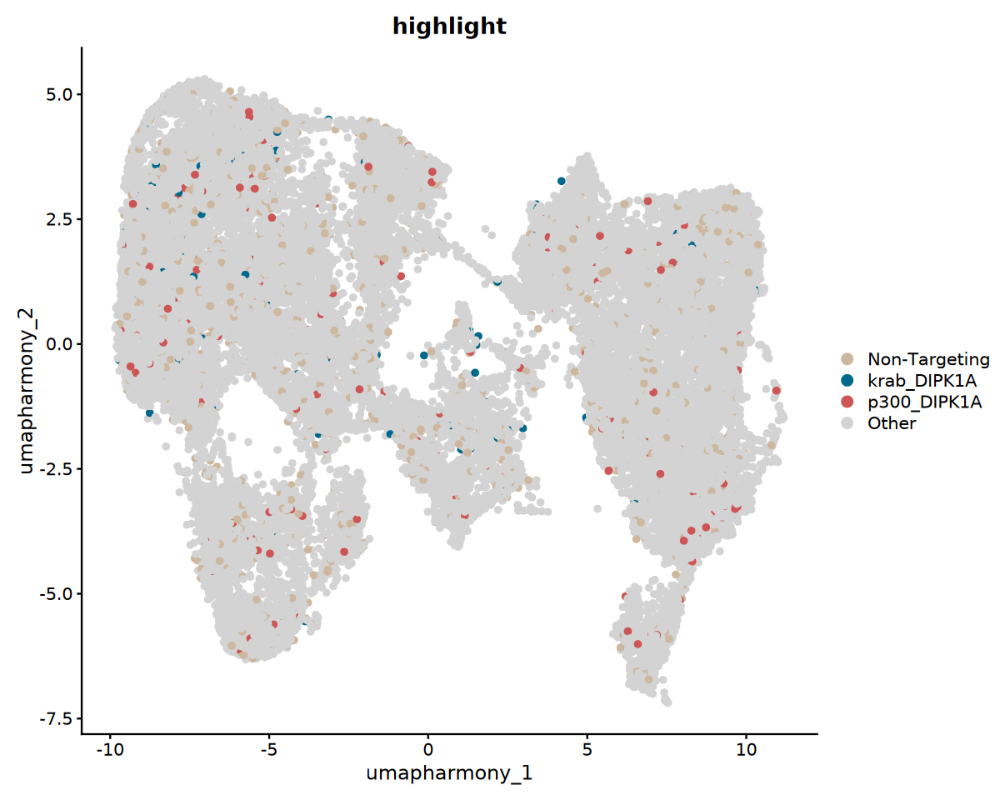

In [97]:
pdim(10,8)
perturb_gRNA_highlight("DIPK1A")

In [203]:
Sep_highlight<-function(obj, gRNA, col_pos, reduction = "umap.harmony"){
    tmp<-obj

    keep_values<-c(paste0(c("krab_","p300_"), gRNA),
                 "krab_Non-Targeting","p300_Non-Targeting")

    vec<-ifelse(tmp@meta.data$Perturb_gRNA %in% keep_values,
                tmp@meta.data$Perturb_gRNA,
                "Other")

    #remove prefix from non targeting
    tmp@meta.data$highlight<-ifelse(grepl("Non-Targeting", vec),
                                       sub("^[^_]+_", "", vec),
                                       vec)

    tmp@meta.data$highlight<-factor(tmp@meta.data$highlight,
                                       levels = c("Other",
                                                  "Non-Targeting",
                                                  paste0(c("krab_","p300_"), gRNA)
                                                  )
                                       )

    
    Idents(tmp)<-"highlight"
    cells_pos_krab<-WhichCells(tmp, idents = paste0("krab_", gRNA))
    cells_pos_p300<-WhichCells(tmp, idents = paste0("p300_", gRNA))
    cells_nontargeting<-WhichCells(tmp, idents = "Non-Targeting")

    cells_pos<-list("Krab-targeted" = cells_pos_krab, 
                    "P300-targeted" = cells_pos_p300 
                    #, "Non-targeting" = cells_nontargeting
                   )

    plt<-DimPlot(tmp, 
                 label = FALSE, 
                 group.by = "highlight",
                 reduction = reduction,
                cells.highlight = cells_pos,
                 pt.size = 0.01,
                 sizes.highlight = 2,
                ) + 
        scale_color_manual(values = c(adjustcolor("lightgrey", alpha.f = 0),
                                      #rgb(red = 211, green = 211, blue = 211, alpha = 0, maxColorValue = 255),
                                      "indianred3",
                                      #"antiquewhite3", 
                                      "deepskyblue4")
                          ) + 
    NoLegend()+
    theme_void()+
    ggtitle(paste0("gRNA highlight for: ", gRNA))

    return(plt)
}

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


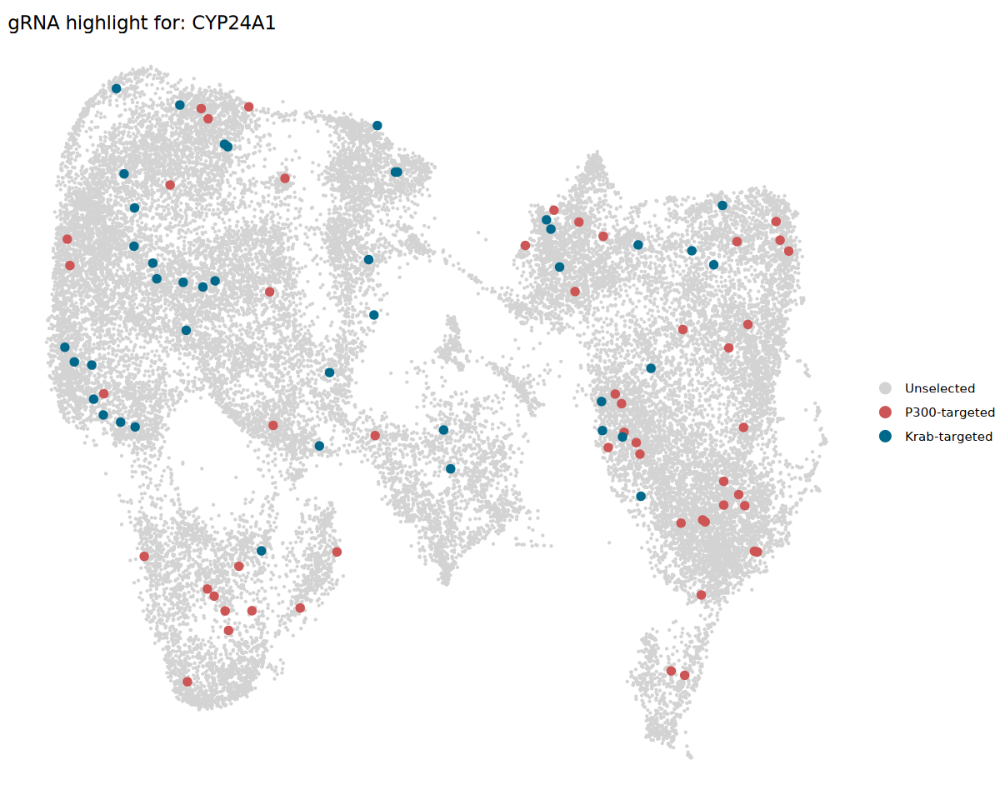

In [204]:
Sep_highlight(obj = kc_sct, gRNA = "CYP24A1")

### visualise gRNA UMI across singlets using big heatmap

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


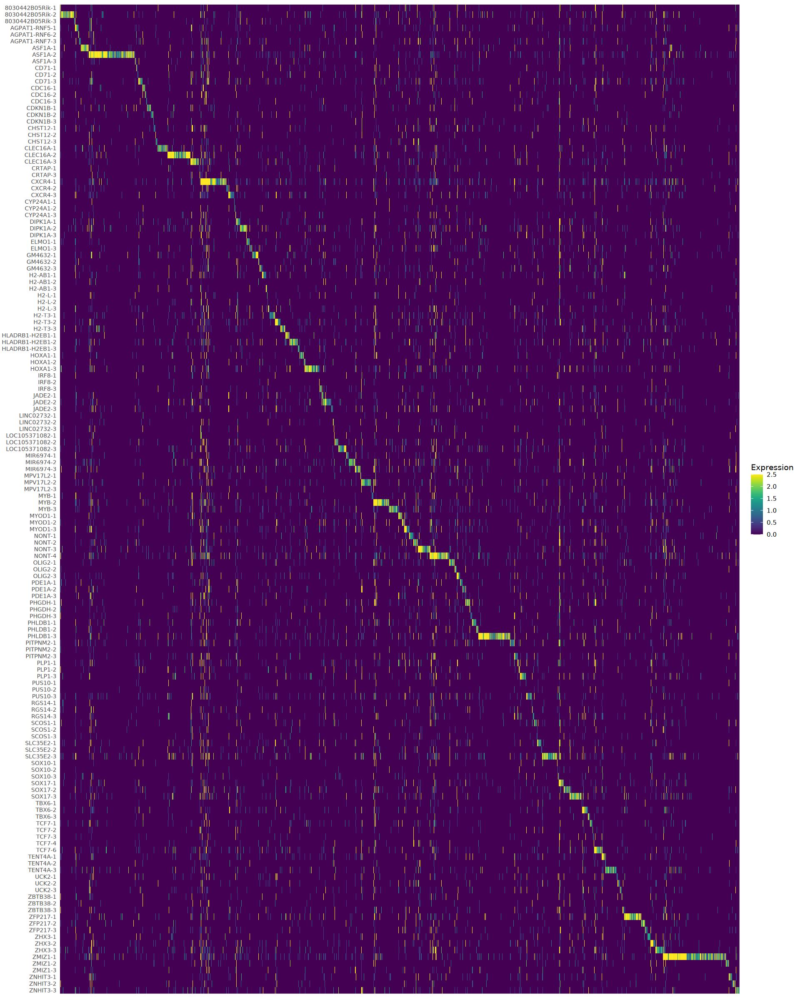

In [260]:
pdim(16,20)
print(HTOHeatmap(kc_rna, assay = 'GDO', classification = 'zscore_guide_calling', 
                 global.classification = 'zscore_guide_state')+ 
          scale_fill_viridis()+
         theme(axis.text.y = element_text(size = 8, face = "italic")))

In [2]:
sessionInfo()

R version 4.4.3 (2025-02-28)
Platform: x86_64-conda-linux-gnu
Running under: AlmaLinux 8.10 (Cerulean Leopard)

Matrix products: default
BLAS/LAPACK: /home/ting/miniconda3/envs/seu5_int/lib/libopenblasp-r0.3.30.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Stockholm
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] batchelor_1.22.0            SingleCellExperiment_1.28.0
 [3] SummarizedExperiment_1.36.0 Biobase_2.66.0             
 [5] GenomicRanges_1.58.0        GenomeInfoDb_1.42.0        
 [7] IRanges_2.40.